In [1]:
%load_ext autoreload

In [59]:
%autoreload 2
from copy import deepcopy
from delase import DeLASE
from delase.metrics import mase
import h5py
from hydra import compose, initialize
from matplotlib import font_manager
from matplotlib.colors import Normalize
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from scipy.stats import mannwhitneyu, pearsonr
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.manifold import MDS
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.model_selection import StratifiedKFold
import sys
from tqdm.auto import tqdm

sys.path.append('../..')
from data_utils import filter_data, find_noisy_data, get_delase_results, get_delase_run_list, get_grid_search_results, get_grid_search_run_list, get_grid_search_window_ts, get_section_info, load_session_data, load_window_from_chunks, resection_grid_results

plt.style.use('/om2/user/eisenaj/code/UniversalUnconsciousness/sci_style.mplstyle')
font_path = "/om2/user/eisenaj/miniforge3/envs/communication-transformer/fonts/arial.ttf"
font_manager.fontManager.addfont(font_path)
prop = font_manager.FontProperties(fname=font_path)

In [3]:
with initialize(version_base="1.3", config_path="../../DeLASE_analysis/conf"):
    cfg = compose(config_name="config")

In [86]:
data_class = cfg.params.data_class
session_list = [f[:-4] for f in os.listdir(os.path.join(cfg.params.all_data_dir, cfg.params.data_class)) if f.endswith('.mat')]
session_list = [session for session in session_list if session not in ['PEDRI_Ketamine_20220203']]

# session_list = [session_list[1]]
# session_list = [session_list[2]]
# session_list = ['SPOCK_Ketamine_20210712', 'PEDRI_Ketamine_20220106', "PEDRI_Ketamine_20220222"]
# session_list = ['PEDRI_Ketamine_20220106']
# session_list = ["PEDRI_Ketamine_20220222"]

session_list = [session for session in session_list if 'Dex' not in session]

# session_list = ['SPOCK_Ketamine_20210707',
#  'SPOCK_Ketamine_20210802',
#  'PEDRI_Ketamine_20220209',
#  'PEDRI_Ketamine_20220224']


In [87]:
# areas = ['vlPFC', 'dlPFC', '-R', '-L']
# areas = ['all', 'vlPFC', 'FEF', '7b', 'CPB']
areas = ['all']

# Filter out Noise

In [88]:
noise_filter_info = {}
if cfg.params.noise_filter:
    os.makedirs(cfg.params.noise_filter_results_dir, exist_ok=True)
    for session in session_list:
        noise_filter_dir = os.path.join(cfg.params.noise_filter_results_dir, cfg.params.data_class)
        os.makedirs(noise_filter_dir, exist_ok=True)
        noise_filter_file = f"{session}__window_{cfg.params.window}__wakethresh_{cfg.params.wake_amplitude_thresh}__anesthesiathresh_{cfg.params.anesthesia_amplitude_thresh}__electrodenum_{cfg.params.electrode_num_thresh}.pkl"
        
        print("--------------------")
        print(f"Session: {session}")
        print("--------------------")
        if noise_filter_file in os.listdir(noise_filter_dir):
            noise_filter_info[session] = pd.read_pickle(os.path.join(noise_filter_dir, noise_filter_file))
        else:
            print("Finding noisy data...")
            window_df, bad_electrodes, valid_window_starts = find_noisy_data(cfg, session)
            noise_filter_info[session] = dict(
                window_df=window_df,
                bad_electrodes=bad_electrodes,
                valid_window_starts=valid_window_starts
            )
            pd.to_pickle(noise_filter_info[session], os.path.join(noise_filter_dir, noise_filter_file))
        
        print(f"{len(noise_filter_info[session]['bad_electrodes'])} bad electrodes, {len(noise_filter_info[session]['valid_window_starts'])} valid windows (out of {len(noise_filter_info[session]['window_df'])} total windows)")
else:
    bad_electrodes = []
    valid_window_starts = None
    noise_filter_info = dict(
        window_df=None,
        bad_electrodes=bad_electrodes,
        valid_window_starts=valid_window_starts
    )

--------------------
Session: SPOCK_Ketamine_20210802
--------------------
16 bad electrodes, 344 valid windows (out of 793 total windows)
--------------------
Session: PEDRI_Ketamine_20220224
--------------------
17 bad electrodes, 534 valid windows (out of 793 total windows)
--------------------
Session: PEDRI_Ketamine_20220228
--------------------
17 bad electrodes, 596 valid windows (out of 833 total windows)
--------------------
Session: SPOCK_Ketamine_20210907
--------------------
23 bad electrodes, 924 valid windows (out of 1033 total windows)
--------------------
Session: SPOCK_Ketamine_20210826
--------------------
20 bad electrodes, 821 valid windows (out of 1033 total windows)
--------------------
Session: PEDRI_Ketamine_20220126
--------------------
2 bad electrodes, 497 valid windows (out of 793 total windows)
--------------------
Session: SPOCK_Ketamine_20210707
--------------------
14 bad electrodes, 1317 valid windows (out of 1336 total windows)
--------------------
Ses

## PCA

In [89]:
if cfg.params.pca:
    pca_chosen = {}
    for session in session_list:
        section_info, section_info_extended, section_colors, infusion_start = get_section_info(session, cfg.params.all_data_dir, cfg.params.data_class)
        
        print("-"*20)
        print(f"SESSION = {session}")
        print("-"*20)
    
        normed_folder = 'NOT_NORMED' if not cfg.params.normed else 'NORMED'
        filter_folder = f"[{cfg.params.high_pass},{cfg.params.low_pass}]" if cfg.params.low_pass is not None or cfg.params.high_pass is not None else 'NO_FILTER'
    
        pca_dir = os.path.join(cfg.params.grid_search_results_dir, cfg.params.data_class, "PCA_info", session, normed_folder, f"SUBSAMPLE_{cfg.params.subsample}", filter_folder, f"WINDOW_{cfg.params.window}")
        os.makedirs(pca_dir, exist_ok=True)
    
        pca_chosen[session] = {}
        for area in areas:
    
            # Get the relevant indices for each area
            os.environ["HDF5_USE_FILE_LOCKING"] = "FALSE"
            variables = ['electrodeInfo']
            session_vars, T, N, dt = load_session_data(session, cfg.params.all_data_dir, variables, data_class=cfg.params.data_class, verbose=False)
            electrode_info = session_vars['electrodeInfo']
    
            if area == 'all':
                dimension_inds = np.arange(len(electrode_info['area']))
            else:
                # dimension_inds = np.where(electrode_info['area'] == area)[0]
                dimension_inds = np.where([area in area_entry for area_entry in electrode_info['area']])[0]
            dimension_inds = np.array([d for d in dimension_inds if d not in noise_filter_info[session]['bad_electrodes']])

            # Get PCA explained variance ratios
            area_pca_file = os.path.join(pca_dir, area)
            if os.path.exists(area_pca_file):
                print(f"Found PCA info for {session}: {area}")
                pca_explained_variance_ratios = pd.read_pickle(area_pca_file)
            else:
                print(f"Computing PCA info for {session}: {area}")
                grid_search_window_start_ts = get_grid_search_window_ts(session, cfg.params.all_data_dir, cfg.params.data_class, section_info, cfg.params.num_windows_per_section, window_radius=30, valid_window_starts=noise_filter_info[session]['valid_window_starts'], random_state=cfg.params.random_state)
    
                directory = pd.read_pickle(os.path.join(cfg.params.all_data_dir, cfg.params.data_class, f"{session}_lfp_chunked_20s", "directory"))
            
                pca_explained_variance_ratios = {}
                for t in tqdm(grid_search_window_start_ts, desc=f'Doing PCA for {session}: {area}'):
                    lfp = load_window_from_chunks(t, t + cfg.params.window, directory=directory, dimension_inds=dimension_inds)
                    lfp = lfp[::cfg.params.subsample]
                    # filter
                    lfp = filter_data(lfp, cfg.params.low_pass, cfg.params.high_pass, dt*cfg.params.subsample)
                    
                    pca = PCA(n_components=lfp.shape[1]).fit(lfp)
                    pca_explained_variance_ratios[t] = pca.explained_variance_ratio_
    
                pd.to_pickle(pca_explained_variance_ratios, area_pca_file)
    
            # pick the max number of PCs across windows greater than the threshold
            pca_chosen[session][area] = np.max([np.argmax(np.cumsum(evr) >= cfg.params.pca_thresh) for evr in pca_explained_variance_ratios.values()])
else:
    pca_chosen = None

# Collect Indices to Run

In [90]:
all_indices_to_run = {}
for session in tqdm(session_list, desc='Getting Grid Search Run List'):
    print("-"*20)
    print(f"SESSION = {session}")
    print("-"*20)
    section_info, section_info_extended, section_colors, infusion_start = get_section_info(session, cfg.params.all_data_dir, cfg.params.data_class)
    grid_search_window_start_ts = get_grid_search_window_ts(session, cfg.params.all_data_dir, cfg.params.data_class, section_info, cfg.params.num_windows_per_section, window_radius=30, valid_window_starts=noise_filter_info[session]['valid_window_starts'], random_state=cfg.params.random_state)
    normed_folder = 'NOT_NORMED' if not cfg.params.normed else 'NORMED'
    filter_folder = f"[{cfg.params.high_pass},{cfg.params.low_pass}]" if cfg.params.low_pass is not None or cfg.params.high_pass is not None else 'NO_FILTER'

    grid_search_run_list = get_grid_search_run_list(session, os.path.join(cfg.params.grid_search_results_dir, cfg.params.data_class), cfg.params.all_data_dir, cfg.params.window, cfg.grid_sets[cfg.params.grid_set], cfg.params.grid_set, grid_search_window_start_ts, cfg.params.T_pred, group_ranks=cfg.params.group_ranks, bad_electrodes=noise_filter_info[session]['bad_electrodes'], verbose=True, random_state=cfg.params.random_state)
    noise_filter_folder = f"NOISE_FILTERED_{cfg.params.window}_{cfg.params.wake_amplitude_thresh}_{cfg.params.anesthesia_amplitude_thresh}_{cfg.params.electrode_num_thresh}" if cfg.params.noise_filter else "NO_NOISE_FILTER"

    for area in areas:
        
        pca_folder = "NO_PCA" if not cfg.params.pca else f"PCA_{pca_chosen[session][area]}"
        save_dir = os.path.join(cfg.params.grid_search_results_dir, cfg.params.data_class, 'grid_search_results', session, noise_filter_folder, normed_folder, f"SUBSAMPLE_{cfg.params.subsample}", filter_folder, f"WINDOW_{cfg.params.window}", cfg.params.grid_set, area, pca_folder)

        os.makedirs(save_dir, exist_ok=True)
        
        saved_files = os.listdir(save_dir)

        
        if not cfg.params.group_ranks:
            # filter runs for those with valid rank
            filtered_run_list = []
            for run_index, run_info in enumerate(grid_search_run_list[area]):
                if cfg.params.pca:
                    n_dims = pca_chosen[session][area]
                else:
                    n_dims = len(run_info['dimension_inds'])
                    if run_info['n_delays']*n_dims >= run_info['rank']:
                        run_info['run_index'] = run_index
                        filtered_run_list.append(run_info)
        else: # runs don't need to be filtered
            filtered_run_list = []
            for run_index, run_info in enumerate(grid_search_run_list[area]):
                run_info['run_index'] = run_index
                filtered_run_list.append(run_info)
        
        indices_to_run = []
        for run_info in filtered_run_list:
            filename = f"run_index-{run_info['run_index']}.pkl"
            if filename not in saved_files:
                indices_to_run.append(run_info['run_index'])
    
        if len(indices_to_run) == 0:
            print(f"*COMPLETE*: All results completed for {session} - {area}!!")
        elif len(indices_to_run) == len(filtered_run_list):
            print(f"NOT STARTED: no results completed for {session} - {area}. Adding all indices! ({len(indices_to_run)})")
            if session not in all_indices_to_run:
                all_indices_to_run[session] = {}
            all_indices_to_run[session][area] = indices_to_run
        else:
            print(f"INCOMPLETE: {session} - {area} incomplete, adding indices {indices_to_run}")
            if session not in all_indices_to_run:
                all_indices_to_run[session] = {}
            all_indices_to_run[session][area] = indices_to_run

Getting Grid Search Run List:   0%|          | 0/30 [00:00<?, ?it/s]

--------------------
SESSION = SPOCK_Ketamine_20210802
--------------------
*COMPLETE*: All results completed for SPOCK_Ketamine_20210802 - all!!
--------------------
SESSION = PEDRI_Ketamine_20220224
--------------------
*COMPLETE*: All results completed for PEDRI_Ketamine_20220224 - all!!
--------------------
SESSION = PEDRI_Ketamine_20220228
--------------------


# Running

In [9]:
os.chdir('/om2/user/eisenaj/code/UniversalUnconsciousness')
batch_size = 250

In [10]:
sessions_to_run = list(all_indices_to_run.keys())
# sessions_to_run = sessions_to_run[:4]

# iterator = tqdm(total=np.sum([len(all_indices_to_run[session]) for session in sessions_to_run]), desc='Hydra Multiprocessing - DSA on Neural Data')
iterator = tqdm(total=np.sum([np.sum([int(np.ceil(len(all_indices_to_run[session][area])/batch_size)) for area in all_indices_to_run[session].keys()]) for session in sessions_to_run]), desc='Hydra Multiprocessing - Grid Search on Neural Data')

for session in sessions_to_run:
    for area in all_indices_to_run[session].keys():
        print(f"Running indices for {session} - {area}")
        num_batches = int(np.ceil(len(all_indices_to_run[session][area])/batch_size))
        for batch_num in range(num_batches):
            batch_start = batch_num*batch_size
            batch_end = np.min([(batch_num + 1)*batch_size, len(all_indices_to_run[session][area])])
            print(f"running batch #{batch_num}")
            if cfg.params.pca:
                os.system(f"HYDRA_FULL_ERROR=1 python DeLASE_analysis/run_grid_search.py -m ++params.session={session} ++params.area={area} ++params.pca_dims={int(pca_chosen[session][area])} ++params.run_index={','.join([str(i) for i in all_indices_to_run[session][area][batch_start:batch_end]])}")
            else:
              os.system(f"HYDRA_FULL_ERROR=1 python DeLASE_analysis/run_grid_search.py -m ++params.session={session} ++params.area={area} ++params.run_index={','.join([str(i) for i in all_indices_to_run[session][area][batch_start:batch_end]])}")
            iterator.update()
iterator.close()

Hydra Multiprocessing - Grid Search on Neural Data: 0it [00:00, ?it/s]

# Collect Grid Search Results

In [11]:
cfg.params.stat_to_use = 'aic'

In [12]:
grid_search_results = get_grid_search_results(cfg, session_list, areas, len(section_info), pca_chosen)

In [13]:
# sections_to_use = ['awake oddball', 'unconscious oddball', 'recovery oddball']
grid_search_results = resection_grid_results(cfg, grid_search_results, cfg.params.sections_to_use)

In [14]:
session = session_list[0]
area = areas[0]

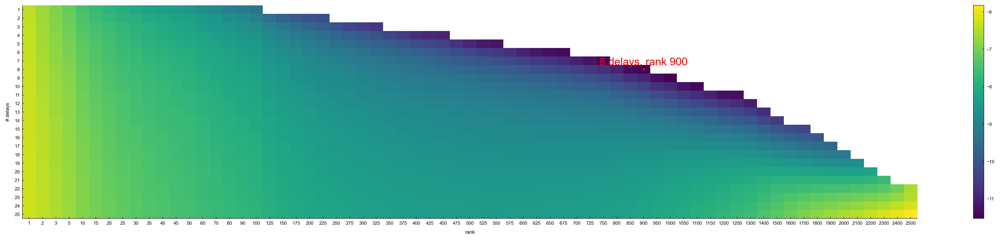

In [15]:
plt.figure(figsize=(26, 5))

nan_vec = np.isnan(grid_search_results[session][area]['mats'][cfg.params.stat_to_use][0, -1])
if np.sum(nan_vec) == 0:
    n_ranks = len(nan_vec)
else:
    n_ranks = np.argmax(nan_vec)
results_to_show = deepcopy(grid_search_results[session][area]['mats'][cfg.params.stat_to_use][:, :, :n_ranks])
# results_to_show[results_to_show == 0] = np.nan

im = plt.imshow(results_to_show.mean(axis=0), aspect='auto')
i, j = grid_search_results[session][area]['i'], grid_search_results[session][area]['j']
plt.scatter(j, i, c='r')
n_delays = grid_search_results[session][area]['n_delays']
rank = grid_search_results[session][area]['rank']
plt.text(j, i - 0.5, f"{n_delays} delays, rank {rank}", c='r', ha='center', fontsize=14)
plt.xticks(np.arange(len(cfg.grid_sets[cfg.params.grid_set].rank_vals))[:n_ranks], cfg.grid_sets[cfg.params.grid_set].rank_vals[:n_ranks])
plt.yticks(np.arange(len(cfg.grid_sets[cfg.params.grid_set].n_delays_vals)), cfg.grid_sets[cfg.params.grid_set].n_delays_vals)
plt.ylabel('# delays')
plt.xlabel('rank')
plt.colorbar(im)
plt.show()

In [16]:
grid_params_to_use = {}
for session in session_list:
    grid_params_to_use[session] = {}
    for area in areas:
        grid_params_to_use[session][area] = {'n_delays': grid_search_results[session][area]['n_delays'], 'rank': grid_search_results[session][area]['rank']}


# Get DeLASE Run List

In [17]:
sections_to_run = ['awake oddball', 'unconscious oddball', 'recovery oddball']

n_delays_max = 10
rank_max = 1100
n_delays_vals = np.array(cfg.grid_sets[cfg.params.grid_set].n_delays_vals)[np.array(cfg.grid_sets[cfg.params.grid_set].n_delays_vals) <= n_delays_max]
rank_vals = np.array(cfg.grid_sets[cfg.params.grid_set].rank_vals)[np.array(cfg.grid_sets[cfg.params.grid_set].rank_vals) <= rank_max]

all_indices_to_run = {}
for session in session_list:
    print("-"*20)
    print(f"SESSION = {session}")
    print("-"*20)
    delase_run_list = get_delase_run_list(cfg, session, valid_window_starts=noise_filter_info[session]['valid_window_starts'], bad_electrodes=noise_filter_info[session]['bad_electrodes'])
    section_info, section_info_extended, section_colors, infusion_start = get_section_info(session, cfg.params.all_data_dir, cfg.params.data_class)

    noise_filter_folder = f"NOISE_FILTERED_{cfg.params.window}_{cfg.params.wake_amplitude_thresh}_{cfg.params.anesthesia_amplitude_thresh}_{cfg.params.electrode_num_thresh}" if cfg.params.noise_filter else "NO_NOISE_FILTER"
    normed_folder = 'NOT_NORMED' if not cfg.params.normed else 'NORMED'
    filter_folder = f"[{cfg.params.high_pass},{cfg.params.low_pass}]" if cfg.params.low_pass is not None or cfg.params.high_pass is not None else 'NO_FILTER'

    for area in areas:
        # Get filtered run list for this area
        filtered_run_list = []
        for section_name, (section_start_min, section_end_min) in section_info:
            if section_name not in sections_to_run:
                continue
            # Convert section times from minutes to seconds and add infusion_start offset
            section_start_sec = section_start_min * 60 + infusion_start
            section_end_sec = section_end_min * 60 + infusion_start
            for run in delase_run_list[area]:
                if run['window_start'] >= section_start_sec and run['window_end'] <= section_end_sec:
                    filtered_run_list.append(run)
        print(f"Filtered run list for {session} - {area} has {len(filtered_run_list)} runs")
        # Track indices to run for each hyperparameter combination
        all_indices = []  # Changed from set() to list since we have unhashable lists
        for n_delays in n_delays_vals:
            for run_info in filtered_run_list:
                # Get all valid ranks for this n_delays value
                valid_ranks = []
                for rank in rank_vals:
                    if rank <= n_delays * len(run_info['dimension_inds']):
                        valid_ranks.append(rank)
                
                # Check if any results are missing for this run_index/n_delays combination
                missing_results = False
                for rank in valid_ranks:
                    grid_folder = f"GRID_RESULTS_n_delays_{n_delays}_rank_{rank}"
                    pca_folder = "NO_PCA" if not cfg.params.pca else f"PCA_{pca_chosen[session][area]}"
                    save_dir = os.path.join(cfg.params.delase_results_dir, cfg.params.data_class, 'delase_results', session, noise_filter_folder, normed_folder, f"SUBSAMPLE_{cfg.params.subsample}", filter_folder, f"WINDOW_{cfg.params.window}", grid_folder, f"STRIDE_{cfg.params.stride}", area, pca_folder)

                    os.makedirs(save_dir, exist_ok=True)
                    filename = f"run_index-{run_info['i']}.pkl"
                    if filename not in os.listdir(save_dir):
                        missing_results = True
                        break

                if missing_results:
                    all_indices.append((run_info['i'], n_delays, tuple(valid_ranks)))  # Convert list to tuple to make it hashable

        # find number of valid n_delays values
        print(f"Number of valid n_delays values: {len(n_delays_vals)}")
        print(f"Number of possible indices to run: {len(filtered_run_list) * len(n_delays_vals)}")

        if len(all_indices) > 0:
            if session not in all_indices_to_run:
                all_indices_to_run[session] = {}
            all_indices_to_run[session][area] = all_indices
            if len(all_indices) == len(filtered_run_list) * len(n_delays_vals):
                print(f"NOT STARTED: no results completed for {session} - {area}. Adding all indices! ({len(all_indices)})")
            else:
                print(f"INCOMPLETE: {session} - {area} incomplete, adding {len(all_indices)} indices")
        else:
            print(f"*COMPLETE*: All results completed for {session} - {area}!!")

--------------------
SESSION = SPOCK_Ketamine_20210707
--------------------
Filtered run list for SPOCK_Ketamine_20210707 - all has 185 runs
Number of valid n_delays values: 10
Number of possible indices to run: 1850
*COMPLETE*: All results completed for SPOCK_Ketamine_20210707 - all!!
--------------------
SESSION = SPOCK_Ketamine_20210802
--------------------
Filtered run list for SPOCK_Ketamine_20210802 - all has 106 runs
Number of valid n_delays values: 10
Number of possible indices to run: 1060
INCOMPLETE: SPOCK_Ketamine_20210802 - all incomplete, adding 144 indices
--------------------
SESSION = PEDRI_Ketamine_20220209
--------------------
Filtered run list for PEDRI_Ketamine_20220209 - all has 150 runs
Number of valid n_delays values: 10
Number of possible indices to run: 1500
INCOMPLETE: PEDRI_Ketamine_20220209 - all incomplete, adding 200 indices
--------------------
SESSION = PEDRI_Ketamine_20220224
--------------------
Filtered run list for PEDRI_Ketamine_20220224 - all has 1

### Run

In [18]:
os.chdir('/om2/user/eisenaj/code/UniversalUnconsciousness')
batch_size = 250

In [19]:
sessions_to_run = list(all_indices_to_run.keys())
# sessions_to_run = sessions_to_run[:4]

# iterator = tqdm(total=np.sum([len(all_indices_to_run[session]) for session in sessions_to_run]), desc='Hydra Multiprocessing - DSA on Neural Data')
iterator = tqdm(total=np.sum([np.sum([int(np.ceil(len(all_indices_to_run[session][area])/batch_size)) for area in all_indices_to_run[session].keys()]) for session in sessions_to_run]), desc='Hydra Multiprocessing - Grid Search on Neural Data')

for session in sessions_to_run:
    for area in all_indices_to_run[session].keys():
        print(f"Running indices for {session} - {area}")
        num_batches = int(np.ceil(len(all_indices_to_run[session][area])/batch_size))
        for batch_num in range(num_batches):
            batch_start = batch_num*batch_size
            batch_end = np.min([(batch_num + 1)*batch_size, len(all_indices_to_run[session][area])])
            print(f"running batch #{batch_num}")
            
            # Get the run indices, n_delays, and ranks for this batch
            batch_indices = all_indices_to_run[session][area][batch_start:batch_end]
            run_indices = [x[0] for x in batch_indices]
            n_delays = batch_indices[0][1]  # All entries in batch should have same n_delays
            ranks = batch_indices[0][2]  # All entries in batch should have same ranks tuple
            
            if cfg.params.pca:
                os.system(f"HYDRA_FULL_ERROR=1 python DeLASE_analysis/run_delase_across_hypers.py -m ++params.session={session} ++params.area={area} ++params.pca_dims={int(pca_chosen[session][area])} ++params.n_delays={n_delays} ++params.rank=[{','.join([str(int(r)) for r in ranks])}] ++params.run_index={','.join([str(i) for i in run_indices])}")
            else:
                os.system(f"HYDRA_FULL_ERROR=1 python DeLASE_analysis/run_delase_across_hypers.py -m ++params.session={session} ++params.area={area} ++params.n_delays={n_delays} ++params.rank=[{','.join([str(int(r)) for r in ranks])}] ++params.run_index={','.join([str(i) for i in run_indices])}")
            iterator.update()
iterator.close()

Hydra Multiprocessing - Grid Search on Neural Data:   0%|          | 0/3 [00:00<?, ?it/s]

Running indices for SPOCK_Ketamine_20210802 - all
running batch #0
[2024-11-06 13:29:24,641][HYDRA] Submitit 'slurm' sweep output dir : multirun/2024-11-06/13-29-00
[2024-11-06 13:29:24,648][HYDRA] 	#0 : ++params.session=SPOCK_Ketamine_20210802 ++params.area=all ++params.n_delays=7 ++params.rank=[1,2,3,5,10,15,20,25,30,35,40,45,50,60,70,80,90,100,125,150,175,200,225,250,275,300,325,350,375,400,425,450,475,500,525,550,575,600,625,650,675,700,725,750] ++params.run_index=17
[2024-11-06 13:29:24,656][HYDRA] 	#1 : ++params.session=SPOCK_Ketamine_20210802 ++params.area=all ++params.n_delays=7 ++params.rank=[1,2,3,5,10,15,20,25,30,35,40,45,50,60,70,80,90,100,125,150,175,200,225,250,275,300,325,350,375,400,425,450,475,500,525,550,575,600,625,650,675,700,725,750] ++params.run_index=18
[2024-11-06 13:29:24,661][HYDRA] 	#2 : ++params.session=SPOCK_Ketamine_20210802 ++params.area=all ++params.n_delays=7 ++params.rank=[1,2,3,5,10,15,20,25,30,35,40,45,50,60,70,80,90,100,125,150,175,200,225,250,275,3

Running indices for PEDRI_Ketamine_20220209 - all
running batch #0
[2024-11-06 13:42:29,017][HYDRA] Submitit 'slurm' sweep output dir : multirun/2024-11-06/13-41-59
[2024-11-06 13:42:29,018][HYDRA] 	#0 : ++params.session=PEDRI_Ketamine_20220209 ++params.area=all ++params.n_delays=9 ++params.rank=[1,2,3,5,10,15,20,25,30,35,40,45,50,60,70,80,90,100,125,150,175,200,225,250,275,300,325,350,375,400,425,450,475,500,525,550,575,600,625,650,675,700,725,750,800,850,900,950] ++params.run_index=39
[2024-11-06 13:42:29,024][HYDRA] 	#1 : ++params.session=PEDRI_Ketamine_20220209 ++params.area=all ++params.n_delays=9 ++params.rank=[1,2,3,5,10,15,20,25,30,35,40,45,50,60,70,80,90,100,125,150,175,200,225,250,275,300,325,350,375,400,425,450,475,500,525,550,575,600,625,650,675,700,725,750,800,850,900,950] ++params.run_index=40
[2024-11-06 13:42:29,029][HYDRA] 	#2 : ++params.session=PEDRI_Ketamine_20220209 ++params.area=all ++params.n_delays=9 ++params.rank=[1,2,3,5,10,15,20,25,30,35,40,45,50,60,70,80,90,1

# Collect DeLASE Results

In [42]:
delase_results = {}
total_iterations = sum(1 
                      for session in session_list 
                      for area in areas if area in grid_params_to_use[session]
                      for n_delays in n_delays_vals 
                      for rank in rank_vals if rank <= n_delays * (h5py.File(os.path.join(cfg.params.all_data_dir, cfg.params.data_class, f"{session}.mat"))['lfp'].shape[0] - len(noise_filter_info[session]['bad_electrodes'])))

with tqdm(total=total_iterations, desc='Getting DeLASE results across hyperparameters') as pbar:
    for session in session_list:
        delase_results[session] = {}
        num_dimensions = h5py.File(os.path.join(cfg.params.all_data_dir, cfg.params.data_class, f"{session}.mat"))['lfp'].shape[0] - len(noise_filter_info[session]['bad_electrodes'])
        for area in areas:
            if area not in grid_params_to_use[session]:
                continue
                
            area_results = []
            for n_delays in [int(n_delays) for n_delays in n_delays_vals]:
                for rank in [int(rank) for rank in rank_vals]:
                    if rank > n_delays * num_dimensions:
                        continue
                    # Get results for this hyperparameter combination
                    result_df = get_delase_results(cfg, [session], [area], 
                                                 {session: {area: {'n_delays': n_delays, 'rank': rank}}},
                                                 pca_chosen)
                    
                    # Add hyperparameter columns
                    result_df[session][area]['n_delays'] = n_delays
                    result_df[session][area]['rank'] = rank
                    
                    area_results.append(result_df[session][area])
                    pbar.update(1)
                    
            # Concatenate all results for this area
            delase_results[session][area] = pd.concat(area_results, ignore_index=True)

Getting DeLASE results across hyperparameters:   0%|          | 0/2040 [00:00<?, ?it/s]

In [48]:
section_info, section_info_extended, section_colors, infusion_start = get_section_info(session, cfg.params.all_data_dir, cfg.params.data_class)

In [49]:
section_info

[('awake lever1', [-36.09750944444445, np.float64(-26.039211666666674)]),
 ('awake oddball',
  [np.float64(-26.039211666666674), np.float64(-10.028583333333335)]),
 ('awake lever2', [np.float64(-10.028583333333335), 0]),
 ('induction', [0, np.float64(9.975899999999994)]),
 ('unconscious oddball',
  [np.float64(9.975899999999994), np.float64(25.986277222222217)]),
 ('early unconscious',
  [np.float64(25.986277222222217), np.float64(60.04254722222221)]),
 ('late unconscious',
  [np.float64(60.04254722222221), np.float64(162.04847777777778)]),
 ('recovery oddball',
  [np.float64(146.07137166666664), np.float64(162.04847777777778)])]

In [51]:
session_infos = {}
for session in tqdm(session_list):
    sesion_vars, _, _, _ = load_session_data(session, cfg.params.all_data_dir, ['sessionInfo'], verbose=False)
    session_infos[session] = sesion_vars['sessionInfo']

  0%|          | 0/4 [00:00<?, ?it/s]

In [67]:
session = session_list[0]

In [70]:
# Get unique hyperparameter values
unique_n_delays = sorted(delase_results[session_list[0]][area]['n_delays'].unique())
unique_ranks = sorted(delase_results[session_list[0]][area]['rank'].unique())

# Lists to store results per session
session_results = {}

total_iterations = sum(1 
                      for session in session_list
                      for area in areas if area in grid_params_to_use[session]
                      for n_delays in n_delays_vals 
                      for rank in rank_vals if rank <= n_delays * (h5py.File(os.path.join(cfg.params.all_data_dir, cfg.params.data_class, f"{session}.mat"))['lfp'].shape[0] - len(noise_filter_info[session]['bad_electrodes'])))

iterator = tqdm(total=total_iterations, desc='Calculating stability differences')

for session in session_list:
    session_results[session] = {
        'stability_differences': [],
        'mean_aics': []
    }
    
    # For each hyperparameter combination
    for n_delays in unique_n_delays:
        for rank in unique_ranks:
            if rank > n_delays * num_dimensions:
                continue
                
            # Get awake oddball results
            awake_start, awake_end = next(t for s,t in section_info if s == 'awake oddball')
            awake_mask = ((delase_results[session][area]['window_start'].apply(
                lambda x: x/60 - session_infos[session]['infusionStart']/60) >= awake_start) & 
                (delase_results[session][area]['window_start'].apply(
                    lambda x: x/60 - session_infos[session]['infusionStart']/60) <= awake_end) &
                (delase_results[session][area]['n_delays'] == n_delays) &
                (delase_results[session][area]['rank'] == rank))
            
            awake_results = delase_results[session][area][awake_mask]
            
            # Calculate mean top 10% stability for awake
            awake_top_10_mean = np.mean([sp[:int(len(sp)*0.1)].mean() 
                                       for sp in awake_results['stability_params']])
            
            # Get unconscious oddball results
            unconscious_start, unconscious_end = next(t for s,t in section_info if s == 'unconscious oddball')
            unconscious_mask = ((delase_results[session][area]['window_start'].apply(
                lambda x: x/60 - session_infos[session]['infusionStart']/60) >= unconscious_start) & 
                (delase_results[session][area]['window_start'].apply(
                    lambda x: x/60 - session_infos[session]['infusionStart']/60) <= unconscious_end) &
                (delase_results[session][area]['n_delays'] == n_delays) &
                (delase_results[session][area]['rank'] == rank))
            
            unconscious_results = delase_results[session][area][unconscious_mask]
            
            # Calculate mean top 10% stability for unconscious
            unconscious_top_10_mean = np.mean([sp[:int(len(sp)*0.1)].mean() 
                                             for sp in unconscious_results['stability_params']])
            
            # Calculate stability difference
            stability_diff = unconscious_top_10_mean - awake_top_10_mean
            
            # Get mean AIC across all windows for this hyperparameter combo
            all_windows_mask = ((delase_results[session][area]['n_delays'] == n_delays) &
                              (delase_results[session][area]['rank'] == rank))
            mean_aic = delase_results[session][area][all_windows_mask]['aic_val'].mean()
            
            session_results[session]['stability_differences'].append(stability_diff)
            session_results[session]['mean_aics'].append(mean_aic)
            iterator.update(1)

iterator.close()

Calculating stability differences:   0%|          | 0/1456 [00:00<?, ?it/s]

/om2/user/eisenaj/miniforge3/envs/universal-unconsciousness/lib/python3.11/site-packages/numpy/_core/fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/om2/user/eisenaj/miniforge3/envs/universal-unconsciousness/lib/python3.11/site-packages/numpy/_core/_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


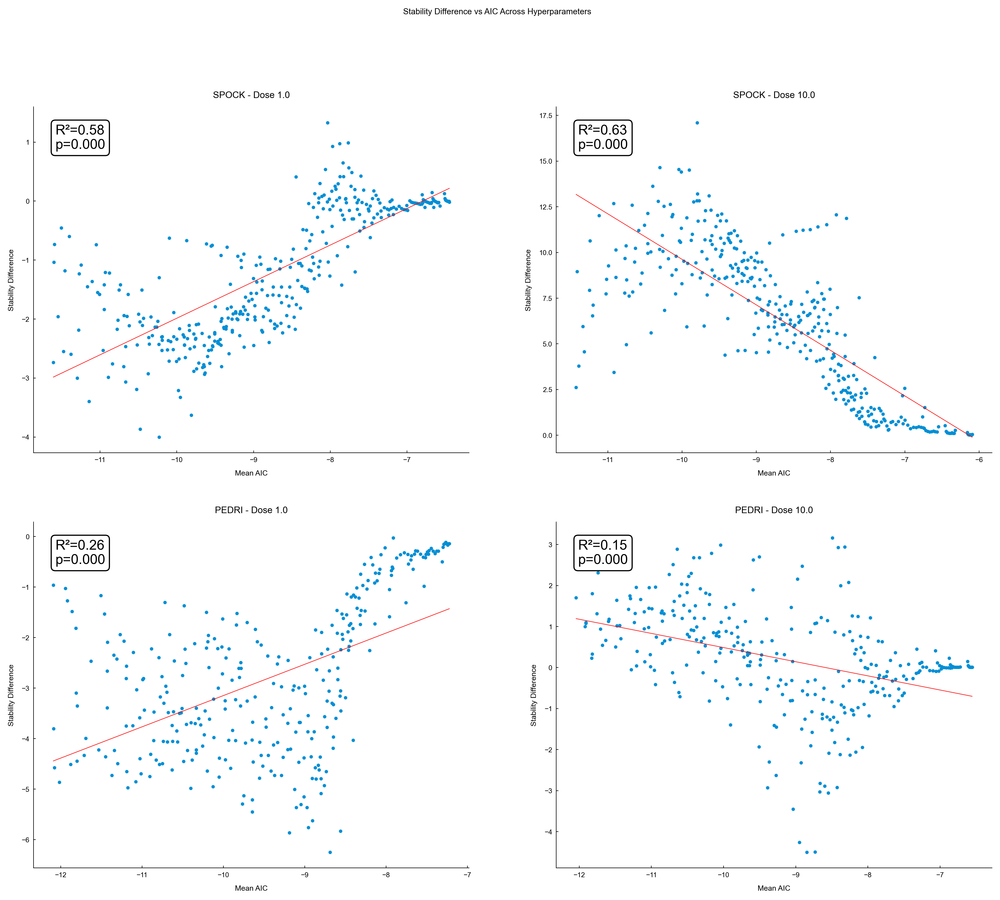

In [84]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import linregress

# Create figure with 4 subplots
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
fig.suptitle('Stability Difference vs AIC Across Hyperparameters')

# Collect all data points for all monkeys and doses
for i, monkey in enumerate(['SPOCK', 'PEDRI']):
    for j, dose in enumerate([1.0, 10.0]):
        ax = axes[i, j]
        
        # Initialize lists to hold stability differences and AICs
        stability_diffs = []
        mean_aics = []
        
        # Filter data for the current monkey and dose
        for session in session_list:
            if (session.split('_')[0] == monkey and 
                session_infos[session]['dose'] == dose):
                stability_diffs.append(session_results[session]['stability_differences'])
                mean_aics.append(session_results[session]['mean_aics'])
        
        # Convert to numpy arrays
        stability_diffs = np.concatenate(stability_diffs)
        mean_aics = np.concatenate(mean_aics)
        
        # Filter out NaN pairs
        mask = ~np.isnan(stability_diffs) & ~np.isnan(mean_aics)
        filtered_stability_diffs = stability_diffs[mask]
        filtered_mean_aics = mean_aics[mask]
        
        # Scatter plot for filtered data
        ax.scatter(filtered_mean_aics, filtered_stability_diffs)
        ax.set_title(f'{monkey} - Dose {dose}')
        ax.set_xlabel('Mean AIC')
        ax.set_ylabel('Stability Difference')
        
        # Perform linear regression
        slope, intercept, r_value, p_value, std_err = linregress(filtered_mean_aics, filtered_stability_diffs)
        
        # Plot regression line
        x_fit = np.linspace(filtered_mean_aics.min(), filtered_mean_aics.max(), 100)
        y_fit = slope * x_fit + intercept
        ax.plot(x_fit, y_fit, color='red', label=f'Fit: y={slope:.2f}x+{intercept:.2f}')
        
        # Add correlation and p-value to the plot
        ax.text(0.05, 0.95, f'R²={r_value**2:.2f}\np={p_value:.3f}', transform=ax.transAxes, fontsize=12,
                verticalalignment='top', bbox=dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='white'))

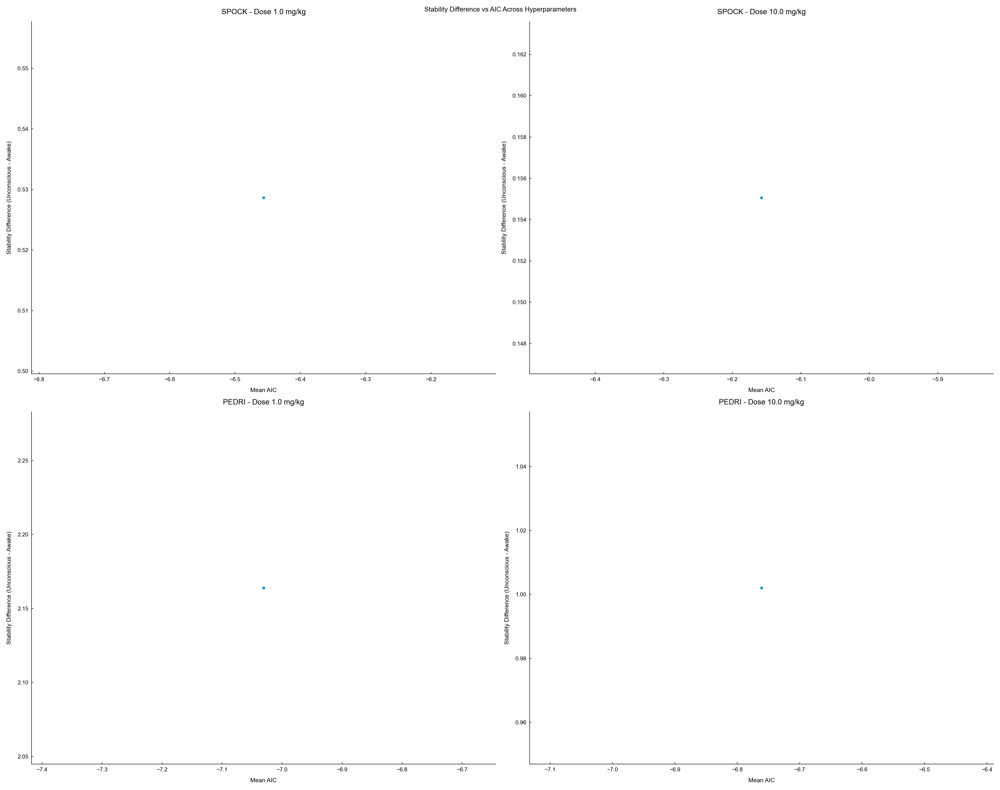

In [82]:


# Create figure with 4 subplots
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
fig.suptitle('Stability Difference vs AIC Across Hyperparameters')

# Collect all data points for all monkeys and doses
x_data = []
y_data = []

# Plot data for all sessions matching monkeys and doses
for session in session_list:
    mean_aics = session_results[session]['mean_aics']
    stability_diffs = session_results[session]['stability_differences']
    
    # Filter out NaN pairs
    for x, y in zip(mean_aics, stability_diffs):
        if not (np.isnan(x) or np.isnan(y)):
            x_data.append(x)
            y_data.append(y)

# Convert to numpy arrays
x_data = np.array(x_data).reshape(-1, 1)  # Reshape for sklearn
y_data = np.array(y_data)

# Plot for each monkey and dose combination
for i, monkey in enumerate(['SPOCK', 'PEDRI']):
    for j, dose in enumerate([1.0, 10.0]):
        ax = axes[i,j]
        
        # Filter data for the current monkey and dose
        filtered_x = []
        filtered_y = []
        
        for session in session_list:
            if (session.split('_')[0] == monkey and 
                session_infos[session]['dose'] == dose):
                filtered_x.append(x_data[session_list.index(session)][0])  # Use append instead of extend
                filtered_y.append(y_data[session_list.index(session)])  # Use append instead of extend
        
        # Scatter plot for filtered data
        ax.scatter(filtered_x, filtered_y)
        
        # Calculate and plot regression line if we have data points
        if len(filtered_x) > 0 and len(filtered_y) > 0:
            model = LinearRegression()
            model.fit(np.array(filtered_x).reshape(-1, 1), np.array(filtered_y))
            x_range = np.linspace(min(filtered_x), max(filtered_x), 100).reshape(-1, 1)
            y_pred = model.predict(x_range)
            ax.plot(x_range, y_pred, "r--", alpha=0.8)
            
            # Calculate correlation coefficient and p-value
            corr_coef, p_value = pearsonr(filtered_x, filtered_y)
            ax.text(0.05, 0.95, f'r = {corr_coef:.3f}, p = {p_value:.3f}', 
                   transform=ax.transAxes, 
                   verticalalignment='top')
                
        ax.set_xlabel('Mean AIC')
        ax.set_ylabel('Stability Difference (Unconscious - Awake)')
        ax.set_title(f'{monkey} - Dose {dose} mg/kg')

plt.tight_layout()
plt.show()

In [22]:
# load trial info
trial_infos = {}
for session in tqdm(session_list):
    sesion_vars, _, _, _ = load_session_data(session, cfg.params.all_data_dir, ['trialInfo'], verbose=False)
    trial_infos[session] = sesion_vars['trialInfo']


  0%|          | 0/4 [00:00<?, ?it/s]

In [23]:
ains = {}
for session in tqdm(session_list):
    session_vars, _, _, _ = load_session_data(session, cfg.params.all_data_dir, ['ain'], verbose=False)
    ains[session] = session_vars['ain']


  0%|          | 0/4 [00:00<?, ?it/s]

In [24]:
# for i, session in enumerate(session_list):
#     plt.plot(delase_results[session]['all'].window_start, delase_results[session]['all'].stability_params.apply(lambda x: x[:int(len(x)*0.1)].mean()), label=f"session = {session}, dose = {session_infos[session]['dose']}")
#     plt.axvline(session_infos[session]['infusionStart'], c='k', ls='--')
# plt.legend(bbox_to_anchor=(1, 1.05))
# plt.show()

### Plotting all sessions separately

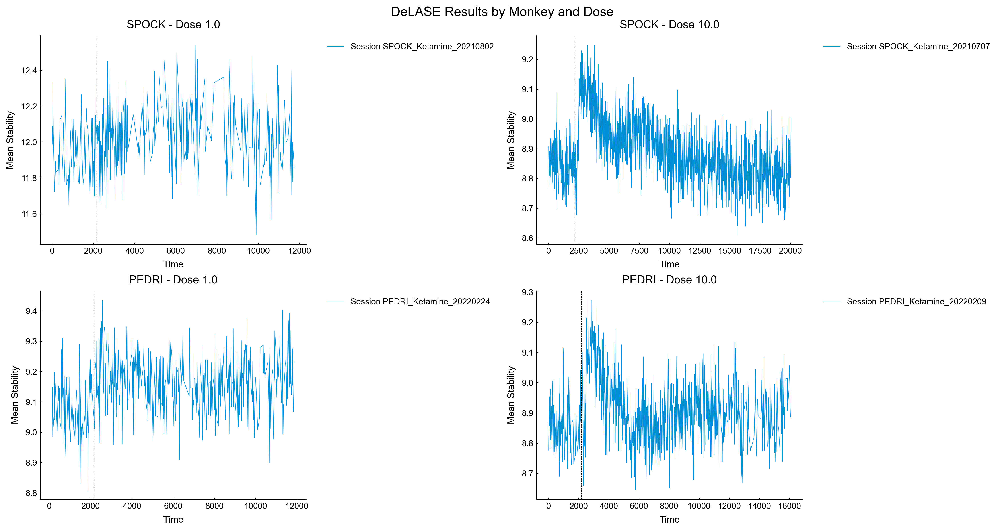

In [24]:
top_percent = 0.1

# Create a dictionary to organize sessions by monkey and dose
session_lists = {
    'SPOCK': {1.0: [], 10.0: []},
    'PEDRI': {1.0: [], 10.0: []}
}

# Populate the dictionary
for session in session_list:
    monkey = session.split('_')[0]
    dose = session_infos[session]['dose']
    if dose in [1.0, 10.0]:
        session_lists[monkey][dose].append(session)

# Create a 2x2 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(15, 8))
fig.suptitle('DeLASE Results by Monkey and Dose', fontsize=14)

# Plot for each monkey and dose
for i, monkey in enumerate(['SPOCK', 'PEDRI']):
    for j, dose in enumerate([1.0, 10.0]):
        ax = axs[i, j]
        ax.set_title(f"{monkey} - Dose {dose}", fontsize=12)
        
        for session in session_lists[monkey][dose]:
            time_vals = delase_results[session]['all'].window_start
            stability_vals = delase_results[session]['all'].stability_params.apply(lambda x: x[:int(len(x)*top_percent)].mean())
            ax.plot(time_vals, stability_vals, label=f"Session {session}")
            ax.axvline(session_infos[session]['infusionStart'], c='k', ls='--')
        
        ax.set_xlabel('Time', fontsize=10)
        ax.set_ylabel('Mean Stability', fontsize=10)
        ax.tick_params(labelsize=9)
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)

plt.tight_layout()
plt.show()


### Plotting all sessions together

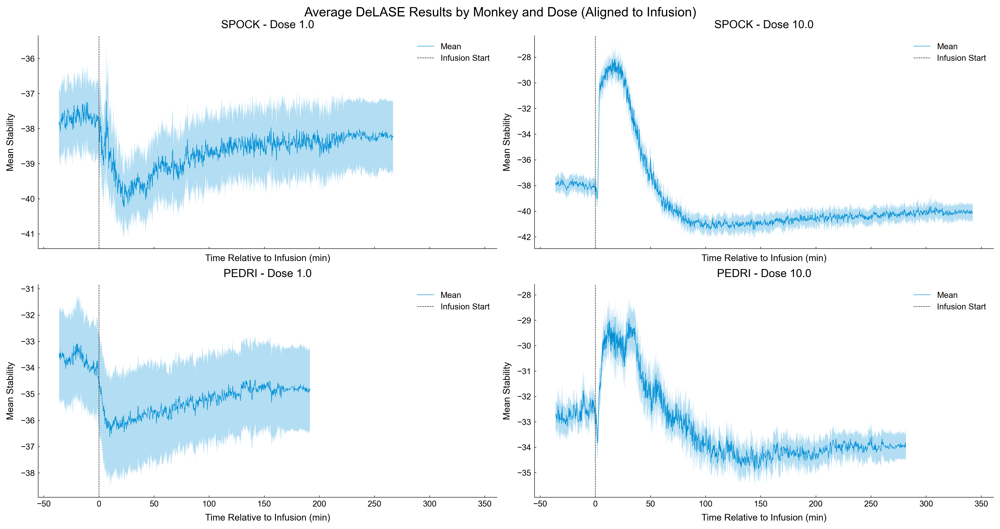

In [26]:
# Create a 2x2 grid of subplots
top_percent = 0.1

fig, axs = plt.subplots(2, 2, figsize=(15, 8), sharex=True)
fig.suptitle('Average DeLASE Results by Monkey and Dose (Aligned to Infusion)', fontsize=14)

# Plot for each monkey and dose
for i, monkey in enumerate(['SPOCK', 'PEDRI']):
    for j, dose in enumerate([1.0, 10.0]):
        ax = axs[i, j]
        ax.set_title(f"{monkey} - Dose {dose}", fontsize=12)
        
        # Collect aligned data from all sessions
        aligned_data = []
        min_start = float('inf')
        max_end = float('-inf')
        
        # First pass - find common time window
        for session in session_lists[monkey][dose]:
            time_vals = delase_results[session]['all'].window_start.values  # Convert to numpy array
            infusion_time = session_infos[session]['infusionStart']
            aligned_times = (time_vals - infusion_time) / 60  # Convert to minutes
            min_start = min(min_start, aligned_times[0])
            max_end = max(max_end, aligned_times[-1])
            
        # Create common time grid
        common_times = np.arange(min_start, max_end, 1/60)  # 1-second intervals converted to minutes
        
        # Second pass - interpolate onto common grid
        for session in session_lists[monkey][dose]:
            if session in ['SPOCK_Ketamine_20210707', 'SPOCK_Ketamine_20210909']:
                continue
            time_vals = delase_results[session]['all'].window_start.values  # Convert to numpy array
            stability_vals = delase_results[session]['all'].stability_params.apply(lambda x: x[:int(len(x)*top_percent)].mean()).values  # Convert to numpy array
            infusion_time = session_infos[session]['infusionStart']
            
            # Align to infusion start and convert to minutes
            aligned_times = (time_vals - infusion_time) / 60
            
            # Interpolate onto common grid
            interpolated = np.interp(common_times, aligned_times, stability_vals)
            aligned_data.append(interpolated)
            
        # Convert to numpy array for easier calculations
        aligned_data = np.array(aligned_data)
        
        # Calculate mean and standard error
        mean_stability = np.mean(aligned_data, axis=0)
        sem_stability = np.std(aligned_data, axis=0) / np.sqrt(len(aligned_data))
        
        # Plot mean and standard error
        ax.plot(common_times, mean_stability, label='Mean')
        ax.fill_between(common_times, 
                       mean_stability - sem_stability,
                       mean_stability + sem_stability,
                       alpha=0.3)
        
        ax.axvline(0, c='k', ls='--', label='Infusion Start')
        ax.set_xlabel('Time Relative to Infusion (min)', fontsize=10)
        ax.set_ylabel('Mean Stability', fontsize=10)
        ax.tick_params(labelsize=9)
        ax.legend(fontsize=9)

plt.tight_layout()
plt.show()


### Plot timescale ratios separately

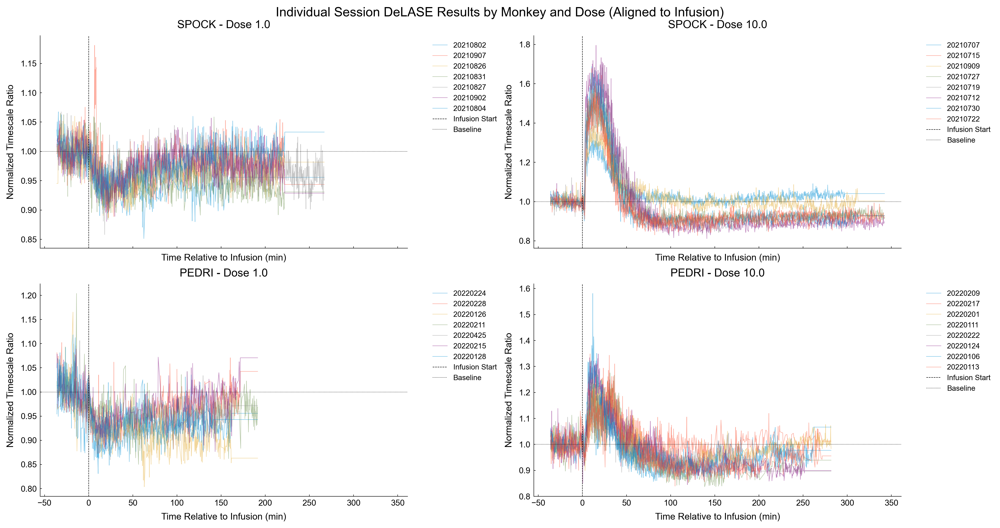

In [27]:
# Create a 2x2 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(15, 8), sharex=True)
fig.suptitle('Individual Session DeLASE Results by Monkey and Dose (Aligned to Infusion)', fontsize=14)

# Plot for each monkey and dose
for i, monkey in enumerate(['SPOCK', 'PEDRI']):
    for j, dose in enumerate([1.0, 10.0]):
        ax = axs[i, j]
        ax.set_title(f"{monkey} - Dose {dose}", fontsize=12)
        
        # First pass - find common time window
        min_start = float('inf')
        max_end = float('-inf')
        
        for session in session_lists[monkey][dose]:
            time_vals = delase_results[session]['all'].window_start.values
            infusion_time = session_infos[session]['infusionStart']
            aligned_times = (time_vals - infusion_time) / 60  # Convert to minutes
            min_start = min(min_start, aligned_times[0])
            max_end = max(max_end, aligned_times[-1])
            
        # Create common time grid
        common_times = np.arange(min_start, max_end, 1/60)  # 1-second intervals converted to minutes
        
        # Second pass - process and plot each session individually
        top_percent = 0.1  # Parameter for top percentage of timescales to keep
        
        for session in session_lists[monkey][dose]:
            time_vals = delase_results[session]['all'].window_start.values
            infusion_time = session_infos[session]['infusionStart']
            
            # Process stability params to get timescales
            def process_stability(x):
                # Keep only negative roots and convert to timescales
                timescales = -1/np.array([r for r in x if r < 0])
                if len(timescales) == 0:
                    return np.nan
                # Take only top percentage of timescales
                n_keep = max(1, int(len(timescales) * top_percent))
                top_timescales = np.sort(timescales)[-n_keep:]
                return np.exp(np.mean(np.log(top_timescales)))  # geometric mean
            
            # Calculate baseline (pre-infusion) geometric mean
            pre_infusion_mask = time_vals < infusion_time
            baseline_timescales = []
            for params in delase_results[session]['all'].stability_params[pre_infusion_mask]:
                timescales = -1/np.array([r for r in params if r < 0])
                if len(timescales) > 0:
                    # Take only top percentage of timescales
                    n_keep = max(1, int(len(timescales) * top_percent))
                    top_timescales = np.sort(timescales)[-n_keep:]
                    baseline_timescales.extend(top_timescales)
            baseline = np.exp(np.mean(np.log(baseline_timescales)))
            
            # Calculate normalized timescales for each window
            stability_vals = delase_results[session]['all'].stability_params.apply(process_stability).values / baseline
            
            # Align to infusion start and convert to minutes
            aligned_times = (time_vals - infusion_time) / 60
            
            # Interpolate onto common grid
            interpolated = np.interp(common_times, aligned_times, stability_vals)
            
            # Plot individual session
            ax.plot(common_times, interpolated, alpha=0.5, label=session.split('_')[-1])
        
        ax.axvline(0, c='k', ls='--', label='Infusion Start')
        ax.axhline(1, c='k', ls=':', label='Baseline')
        ax.set_xlabel('Time Relative to Infusion (min)', fontsize=10)
        ax.set_ylabel('Normalized Timescale Ratio', fontsize=10)
        ax.tick_params(labelsize=9)
        ax.legend(fontsize=8, bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


### Plot timescale ratios together

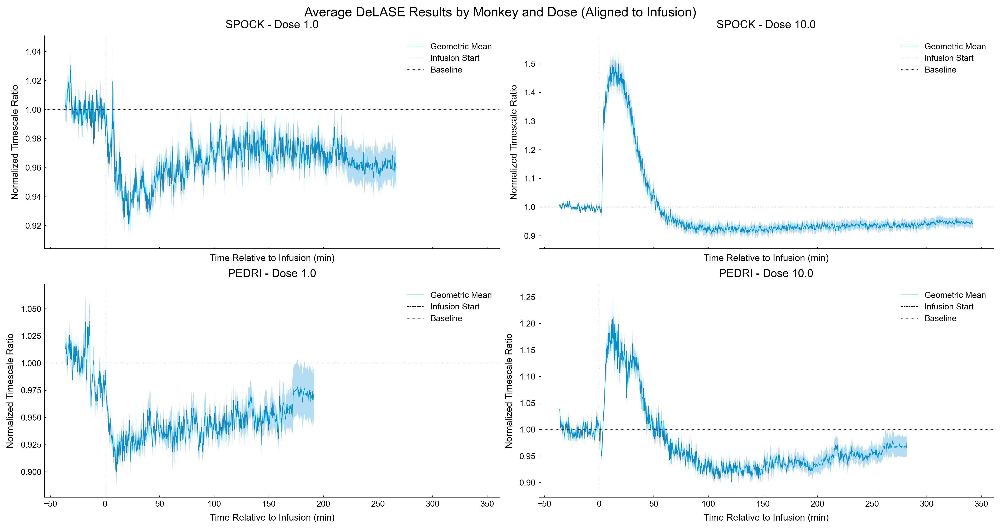

In [28]:
# Create a 2x2 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(15, 8), sharex=True)
fig.suptitle('Average DeLASE Results by Monkey and Dose (Aligned to Infusion)', fontsize=14)

# Plot for each monkey and dose
for i, monkey in enumerate(['SPOCK', 'PEDRI']):
    for j, dose in enumerate([1.0, 10.0]):
        ax = axs[i, j]
        ax.set_title(f"{monkey} - Dose {dose}", fontsize=12)
        
        # Collect aligned data from all sessions
        aligned_data = []
        min_start = float('inf')
        max_end = float('-inf')
        
        # Parameter for top percentage of timescales to keep
        top_percent = 0.1
        
        # First pass - find common time window
        for session in session_lists[monkey][dose]:
            time_vals = delase_results[session]['all'].window_start.values  # Convert to numpy array
            infusion_time = session_infos[session]['infusionStart']
            aligned_times = (time_vals - infusion_time) / 60  # Convert to minutes
            min_start = min(min_start, aligned_times[0])
            max_end = max(max_end, aligned_times[-1])
            
        # Create common time grid
        common_times = np.arange(min_start, max_end, 1/60)  # 1-second intervals converted to minutes
        
        # Second pass - interpolate onto common grid
        for session in session_lists[monkey][dose]:
            time_vals = delase_results[session]['all'].window_start.values  # Convert to numpy array
            infusion_time = session_infos[session]['infusionStart']
            
            # Process stability params to get timescales
            def process_stability(x):
                # Keep only negative roots and convert to timescales
                timescales = -1/np.array([r for r in x if r < 0])
                if len(timescales) == 0:
                    return np.nan
                # Take only top percentage of timescales
                n_keep = max(1, int(len(timescales) * top_percent))
                top_timescales = np.sort(timescales)[-n_keep:]
                return np.exp(np.mean(np.log(top_timescales)))  # geometric mean
            
            # Calculate baseline (pre-infusion) geometric mean
            pre_infusion_mask = time_vals < infusion_time
            baseline_timescales = []
            for params in delase_results[session]['all'].stability_params[pre_infusion_mask]:
                timescales = -1/np.array([r for r in params if r < 0])
                if len(timescales) > 0:
                    # Take only top percentage of timescales
                    n_keep = max(1, int(len(timescales) * top_percent))
                    top_timescales = np.sort(timescales)[-n_keep:]
                    baseline_timescales.extend(top_timescales)
            baseline = np.exp(np.mean(np.log(baseline_timescales)))
            
            # Calculate normalized timescales for each window
            stability_vals = delase_results[session]['all'].stability_params.apply(process_stability).values / baseline
            
            # Align to infusion start and convert to minutes
            aligned_times = (time_vals - infusion_time) / 60
            
            # Interpolate onto common grid
            interpolated = np.interp(common_times, aligned_times, stability_vals)
            aligned_data.append(interpolated)
            
        # Convert to numpy array for easier calculations
        aligned_data = np.array(aligned_data)
        
        # Calculate geometric mean and standard error
        log_data = np.log(aligned_data)
        mean_log = np.nanmean(log_data, axis=0)
        sem_log = np.nanstd(log_data, axis=0) / np.sqrt(np.sum(~np.isnan(log_data), axis=0))
        
        mean_stability = np.exp(mean_log)
        upper_bound = np.exp(mean_log + sem_log)
        lower_bound = np.exp(mean_log - sem_log)
        
        # Plot geometric mean and standard error
        ax.plot(common_times, mean_stability, label='Geometric Mean')
        ax.fill_between(common_times, 
                       lower_bound,
                       upper_bound,
                       alpha=0.3)
        
        ax.axvline(0, c='k', ls='--', label='Infusion Start')
        ax.axhline(1, c='k', ls=':', label='Baseline')
        ax.set_xlabel('Time Relative to Infusion (min)', fontsize=10)
        ax.set_ylabel('Normalized Timescale Ratio', fontsize=10)
        ax.tick_params(labelsize=9)
        ax.legend(fontsize=9)

plt.tight_layout()
plt.show()


### Plot timescale ratios together on a single plot

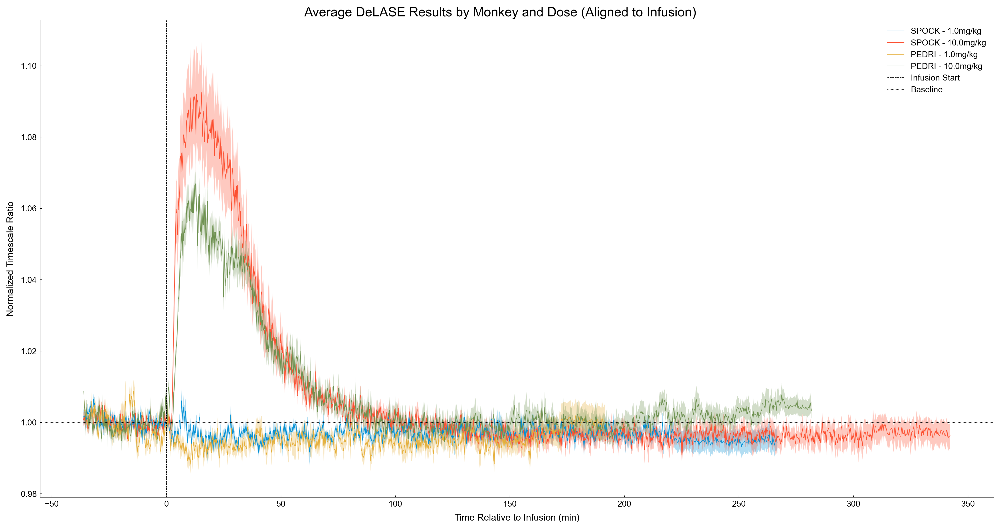

In [33]:
# Create a single plot
fig, ax = plt.subplots(figsize=(15, 8))
fig.suptitle('Average DeLASE Results by Monkey and Dose (Aligned to Infusion)', fontsize=14)

# Plot for each monkey and dose
for monkey in ['SPOCK', 'PEDRI']:
    for dose in [1.0, 10.0]:
        # Collect aligned data from all sessions
        aligned_data = []
        min_start = float('inf')
        max_end = float('-inf')
        
        # Parameter for top percentage of timescales to keep
        top_percent = 0.1
        
        # First pass - find common time window
        for session in session_lists[monkey][dose]:
            time_vals = delase_results[session]['all'].window_start.values  # Convert to numpy array
            infusion_time = session_infos[session]['infusionStart']
            aligned_times = (time_vals - infusion_time) / 60  # Convert to minutes
            min_start = min(min_start, aligned_times[0])
            max_end = max(max_end, aligned_times[-1])
            
        # Create common time grid
        common_times = np.arange(min_start, max_end, 1/60)  # 1-second intervals converted to minutes
        
        # Second pass - interpolate onto common grid
        for session in session_lists[monkey][dose]:
            # if session in ['SPOCK_Ketamine_20210707', 'SPOCK_Ketamine_20210909']:
            #     continue
            time_vals = delase_results[session]['all'].window_start.values  # Convert to numpy array
            infusion_time = session_infos[session]['infusionStart']
            
            # Process stability params to get timescales
            def process_stability(x):
                # Keep only negative roots and convert to timescales
                timescales = -1/np.array([r for r in x if r < 0])
                if len(timescales) == 0:
                    return np.nan
                # Take only top percentage of timescales
                n_keep = max(1, int(len(timescales) * top_percent))
                top_timescales = np.sort(timescales)[-n_keep:]
                return np.exp(np.mean(np.log(top_timescales)))  # geometric mean
            
            # Calculate baseline (pre-infusion) geometric mean
            pre_infusion_mask = time_vals < infusion_time
            baseline_timescales = []
            for params in delase_results[session]['all'].stability_params[pre_infusion_mask]:
                timescales = -1/np.array([r for r in params if r < 0])
                if len(timescales) > 0:
                    # Take only top percentage of timescales
                    n_keep = max(1, int(len(timescales) * top_percent))
                    top_timescales = np.sort(timescales)[-n_keep:]
                    baseline_timescales.extend(top_timescales)
            baseline = np.exp(np.mean(np.log(baseline_timescales)))
            
            # Calculate normalized timescales for each window
            stability_vals = delase_results[session]['all'].stability_params.apply(process_stability).values / baseline
            
            # Align to infusion start and convert to minutes
            aligned_times = (time_vals - infusion_time) / 60
            
            # Interpolate onto common grid
            interpolated = np.interp(common_times, aligned_times, stability_vals)
            aligned_data.append(interpolated)
            
        # Convert to numpy array for easier calculations
        aligned_data = np.array(aligned_data)
        
        # Calculate geometric mean and standard error
        log_data = np.log(aligned_data)
        mean_log = np.nanmean(log_data, axis=0)
        sem_log = np.nanstd(log_data, axis=0) / np.sqrt(np.sum(~np.isnan(log_data), axis=0))
        
        mean_stability = np.exp(mean_log)
        upper_bound = np.exp(mean_log + sem_log)
        lower_bound = np.exp(mean_log - sem_log)
        
        # Plot geometric mean and standard error with unique label
        ax.plot(common_times, mean_stability, label=f'{monkey} - {dose}mg/kg')
        ax.fill_between(common_times, 
                       lower_bound,
                       upper_bound,
                       alpha=0.3)

ax.axvline(0, c='k', ls='--', label='Infusion Start')
ax.axhline(1, c='k', ls=':', label='Baseline')
ax.set_xlabel('Time Relative to Infusion (min)', fontsize=10)
ax.set_ylabel('Normalized Timescale Ratio', fontsize=10)
ax.tick_params(labelsize=9)
ax.legend(fontsize=9)

plt.tight_layout()
plt.show()


### Investigate relationship between stability and lever press

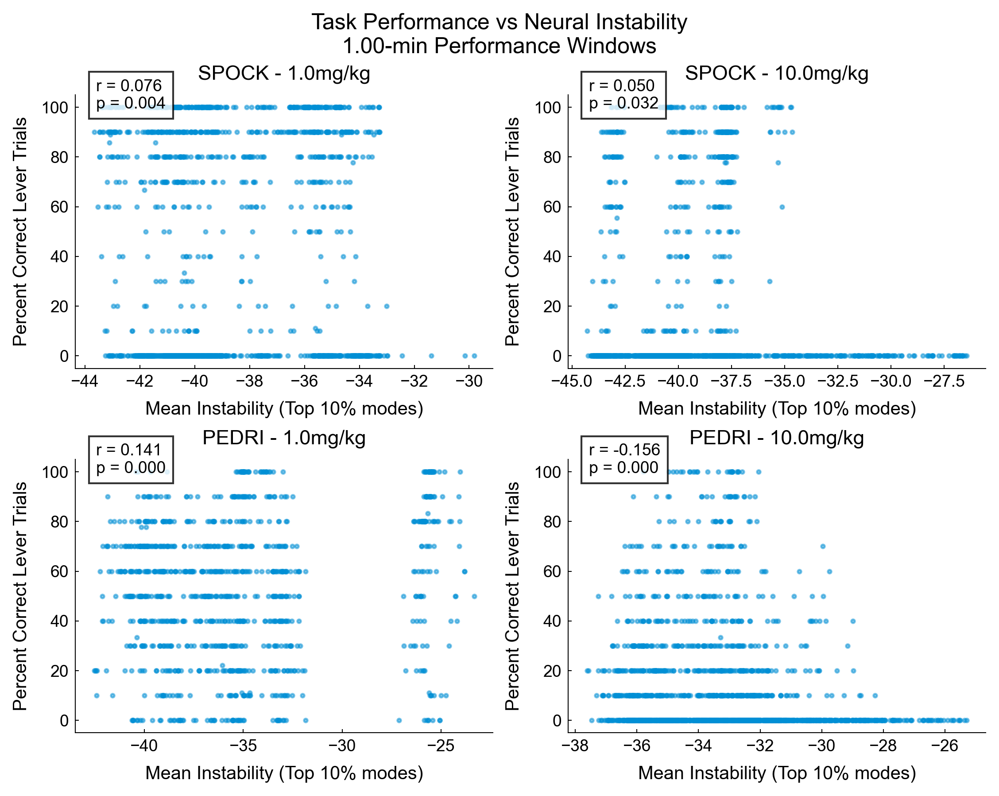

In [38]:
def get_performance_in_window(trial_info, window_start, window_end):
    """Calculate performance metrics for trials within a time window"""
    # Get lever trials only
    lever_trial_times = trial_info['trialStart'][trial_info['task'] == 'lever']
    lever_correct = trial_info['lvr_correct']  # Already only includes lever trials
    
    # Find trials in window
    in_window = (lever_trial_times >= window_start) & (lever_trial_times <= window_end)
    
    if np.sum(in_window) == 0:
        return np.nan
        
    # Calculate percent correct
    pct_correct = 100 * np.mean(lever_correct[in_window])
    return pct_correct

# Create figure with 4 subplots (2x2)
fig, axes = plt.subplots(2, 2, figsize=(7.5, 6))

# Flatten axes for easier iteration
axes = axes.flatten()

# Plot index counter
plot_idx = 0

# For each monkey
for monkey in ['SPOCK', 'PEDRI']:
    # For each dose
    for dose in [1.0, 10.0]:
        # Lists to store all data points
        all_performances = []
        all_instabilities = []
        
        # Process each session
        for session in session_lists[monkey][dose]:
            if session in ['SPOCK_Ketamine_20210707', 'SPOCK_Ketamine_20210909']:
                continue
            # Define window sizes
            large_window = 60  # s
            small_window = cfg.params.window  # 15 second window from DeLASE

            # Get time range from DeLASE results
            min_time = delase_results[session]['all']['window_start'].min()
            max_time = delase_results[session]['all']['window_start'].max()

            # Create non-overlapping 1-minute windows
            window_starts = np.arange(min_time, max_time, large_window)

            for window_start in window_starts:
                window_end = window_start + large_window
                
                # Get performance for 1-minute window
                pct_correct = get_performance_in_window(trial_infos[session], window_start, window_end)
                
                # Get all DeLASE windows that fall within this 1-minute window
                delase_in_window = delase_results[session]['all'][
                    (delase_results[session]['all']['window_start'] >= window_start) &
                    (delase_results[session]['all']['window_start'] <= window_end)
                ]
                
                # Average instability across all 15s windows within the 1-minute window
                if len(delase_in_window) > 0:
                    mean_instability = np.mean([
                        row['stability_params'][:int(len(row['stability_params'])*0.1)].mean() 
                        for _, row in delase_in_window.iterrows()
                    ])
                    
                    all_performances.append(pct_correct)
                    all_instabilities.append(mean_instability)

        # Convert to numpy arrays
        all_performances = np.array(all_performances)
        all_instabilities = np.array(all_instabilities)
        
        # Remove NaN values
        valid_points = ~np.isnan(all_performances)
        all_performances = all_performances[valid_points]
        all_instabilities = all_instabilities[valid_points]
        
        # Create scatter plot
        axes[plot_idx].scatter(all_instabilities, all_performances, alpha=0.5)
        axes[plot_idx].set_xlabel('Mean Instability (Top 10% modes)', fontsize=10)
        axes[plot_idx].set_ylabel('Percent Correct Lever Trials', fontsize=10)
        axes[plot_idx].set_title(f'{monkey} - {dose}mg/kg', fontsize=11)
        axes[plot_idx].tick_params(labelsize=9)
        
        # Add vertical line at x=0
        # axes[plot_idx].axvline(x=0, color='k', linestyle='--', alpha=0.3)
        
        # Add correlation coefficient and p-value
        corr, p_value = pearsonr(all_instabilities, all_performances)
        axes[plot_idx].text(0.05, 0.95, f'r = {corr:.3f}\np = {p_value:.3f}',
                          transform=axes[plot_idx].transAxes,
                          bbox=dict(facecolor='white', alpha=0.8),
                          fontsize=9)
        
        plot_idx += 1
fig.suptitle(f'Task Performance vs Neural Instability\n{large_window/60:.2f}-min Performance Windows', fontsize=12)
plt.tight_layout()
plt.show()

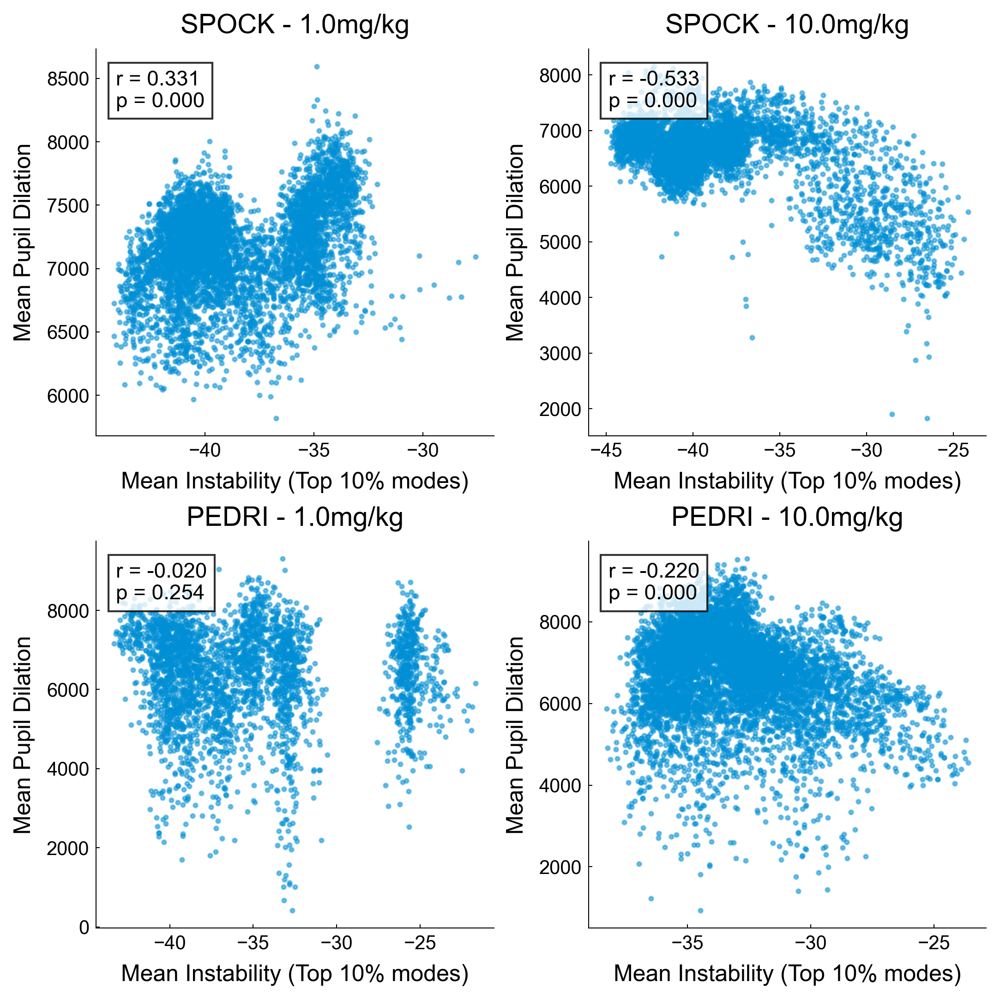

In [37]:
# Create figure with subplots for each monkey/dose combination
monkeys = ['SPOCK', "PEDRI"]  # Add other monkeys as needed
doses = [1.0, 10.0]  # Add other doses as needed

fig, axes = plt.subplots(len(monkeys), len(doses), figsize=(3.6*len(doses), 3.6*len(monkeys)), squeeze=False)
plot_idx = 0

for monkey_idx, monkey in enumerate(monkeys):
    for dose_idx, dose in enumerate(doses):
        # Initialize lists to store results for this monkey/dose
        all_instabilities = []
        all_pupil_means = []
        
        # Process each session for this monkey/dose combination
        for session in session_lists[monkey][dose]:
            if session in ['SPOCK_Ketamine_20210707', 'SPOCK_Ketamine_20210909']:
                continue
            # Get pupil data (7th column of ains)
            if ains[session].shape[-1] == 7:
                pupil_data = ains[session][:, 6]  # Using index 6 for 7th column
                
                # Process each window
                for _, row in delase_results[session]['all'].iterrows():
                    # Convert window times from seconds to samples (1kHz sampling rate)
                    start_idx = int(row['window_start'] * 1000)
                    end_idx = int(row['window_end'] * 1000)
                    
                    # Get pupil data for this window
                    window_pupil = pupil_data[start_idx:end_idx]
                    
                    # Remove NaN values
                    valid_pupil = window_pupil[~np.isnan(window_pupil)]
                    
                    # Only include window if there are valid pupil measurements
                    if len(valid_pupil) > 0:
                        # Calculate mean instability for top 10% modes
                        mean_instability = row['stability_params'][:int(len(row['stability_params'])*0.1)].mean()
                        
                        # Calculate mean pupil dilation for this window
                        mean_pupil = np.mean(valid_pupil)
                        
                        all_instabilities.append(mean_instability)
                        all_pupil_means.append(mean_pupil)
        
        # Create scatter plot
        axes[monkey_idx, dose_idx].scatter(all_instabilities, all_pupil_means, alpha=0.5)
        axes[monkey_idx, dose_idx].set_xlabel('Mean Instability (Top 10% modes)', fontsize=12)
        axes[monkey_idx, dose_idx].set_ylabel('Mean Pupil Dilation', fontsize=12)
        axes[monkey_idx, dose_idx].set_title(f'{monkey} - {dose}mg/kg', fontsize=14)
        axes[monkey_idx, dose_idx].tick_params(labelsize=10)
        
        # Add correlation coefficient and p-value
        if len(all_instabilities) > 1:  # Need at least 2 points for correlation
            corr, p_value = pearsonr(all_instabilities, all_pupil_means)
            axes[monkey_idx, dose_idx].text(0.05, 0.85, f'r = {corr:.3f}\np = {p_value:.3f}',
                                          transform=axes[monkey_idx, dose_idx].transAxes,
                                          bbox=dict(facecolor='white', alpha=0.8),
                                          fontsize=11)

plt.tight_layout()
plt.show()


### Random

In [90]:
x = delase_results[session]['all'].stability_params.iloc[0]


In [79]:
session_lists['SPOCK'][10.0]

['SPOCK_Ketamine_20210707',
 'SPOCK_Ketamine_20210715',
 'SPOCK_Ketamine_20210909',
 'SPOCK_Ketamine_20210727',
 'SPOCK_Ketamine_20210719',
 'SPOCK_Ketamine_20210712',
 'SPOCK_Ketamine_20210730',
 'SPOCK_Ketamine_20210722']

In [38]:
monkey = 'SPOCK'
dose = 10.0

In [49]:
for session in session_lists[monkey][dose]:
    print(session, grid_search_results[session]['all']['n_delays'], grid_search_results[session]['all']['rank'])


SPOCK_Ketamine_20210707 8 900
SPOCK_Ketamine_20210715 9 950
SPOCK_Ketamine_20210909 8 850
SPOCK_Ketamine_20210727 9 900
SPOCK_Ketamine_20210719 9 1000
SPOCK_Ketamine_20210712 9 900
SPOCK_Ketamine_20210730 9 950
SPOCK_Ketamine_20210722 9 950


In [62]:
for session in session_lists[monkey][dose]:
    print(session, np.sum(delase_results[session]['all'].stability_params.apply(lambda x: x[4]) > 0))


PEDRI_Ketamine_20220209 0
PEDRI_Ketamine_20220217 0
PEDRI_Ketamine_20220201 0
PEDRI_Ketamine_20220111 0
PEDRI_Ketamine_20220222 0
PEDRI_Ketamine_20220124 0
PEDRI_Ketamine_20220106 0
PEDRI_Ketamine_20220113 0


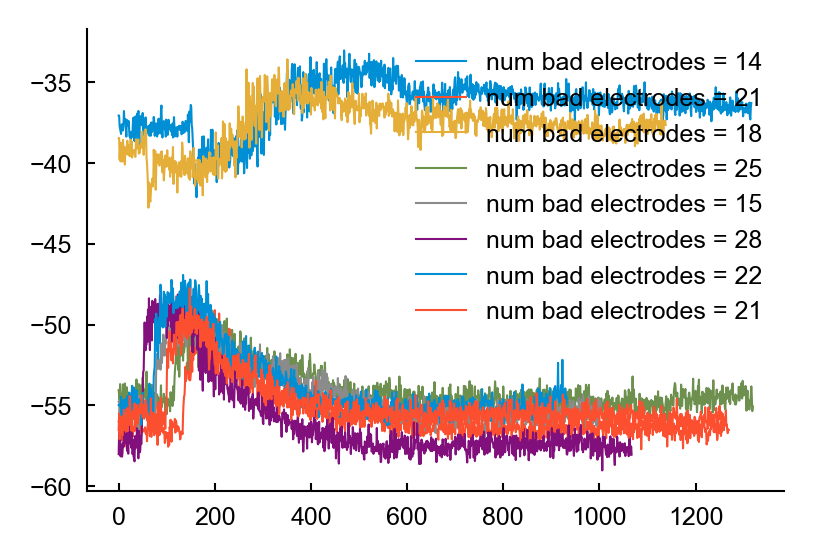

In [46]:
session = session_lists[monkey][dose][0]
for session in session_lists[monkey][dose]:
    plt.plot(delase_results[session]['all'].stability_params.apply(lambda x: x[:int(len(x)*0.1)].mean()), label=f"num bad electrodes = {len(noise_filter_info[session]['bad_electrodes'])}")
plt.legend()
plt.show()

In [48]:
session_infos[session]

{'Properties': {'Description': 'Per-session event data',
  'DimensionNames': array(['Session', 'Variable'], dtype=object),
  'RowNames': 'SPOCK_Ketamine_20210722',
  'UserData': {'history': array(['load from /mnt/common/Jesus/raw/SPOCK/Ketamine/SPOCK_Ketamine_20210722.nev',
          'convertUnits(ticks,s)'], dtype=object)},
  'VariableContinuity': array([], dtype=uint64),
  'VariableDescriptions': array(['SessionID string', 'Subject name', 'Experiment types', 'Date',
         'Tasks run in session', 'Total number of trials',
         'Number of correct trials (over all trials)',
         'Percent correct responses (over all trials)',
         'Drug (or saline or sham) used in session',
         'Drug dosage (mg/kg or ug/kg) used in session',
         'Start of anesthetic drug IM infusion(s)',
         'End of anesthetic drug IM infusion(s)'], dtype=object),
  'VariableNames': array(['session', 'subject', 'expType', 'date', 'tasks', 'numTrials',
         'numCorrect', 'pctCorrect', 'dr